# EDA

In [1]:
import pyreadr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from dateutil.parser import parse
import warnings
warnings.filterwarnings('ignore')

## Import data

In [2]:
result = pyreadr.read_r('/Users/zhenghuijing/Downloads/ECG_BNP_median_143k_hashed_2705.Rdata') 
print(result.keys())

odict_keys(['ECG_BNP_median_140k'])


In [3]:
ECG_BNP_10sec_median = result["ECG_BNP_median_140k"]
df = pd.DataFrame(ECG_BNP_10sec_median) #(143392, 3606)
df.head(1) #each lead has 300 points

,PID,Age,Gender,ECG_date_time,Blood_date_time,BNP,I.1,I.2,I.3,I.4,...,V6.291,V6.292,V6.293,V6.294,V6.295,V6.296,V6.297,V6.298,V6.299,V6.300
0,cb685a31f7c9a49786b071da363566af,79.948059,MALE,11-23-2020 13:34:24,27-06-2016 08:01,147.06723,5,5,5,4,...,9,8,8,8,0,0,0,0,0,0


In [4]:
df['diff'] = df['ECG_date_time'] 
for i in range(len(df)):
    start = parse(str(df['ECG_date_time'][i]))
    end = parse(str(df['Blood_date_time'][i]))
    df['diff'][i] = (start-end).days

#### data description

## Missing value & outlier check

#### no missing values

In [6]:
print(df.isnull().sum())

PID                0
Age                2
Gender             0
ECG_date_time      0
Blood_date_time    0
                  ..
V6.297             0
V6.298             0
V6.299             0
V6.300             0
diff               0
Length: 3607, dtype: int64


#### outlier points exist

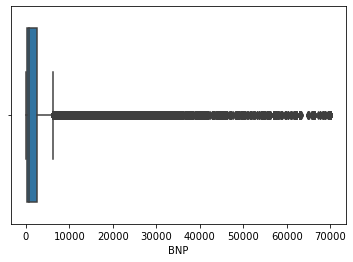

In [7]:
sns.boxplot(x="BNP", data = df)
plt.show() 

## Data visualization

#### Using original data (before removing outliers)

#### Plot1: ECG and BNP ime difference  
#### Plot2: BNP distribution 
#### Plot3: Age distribution 

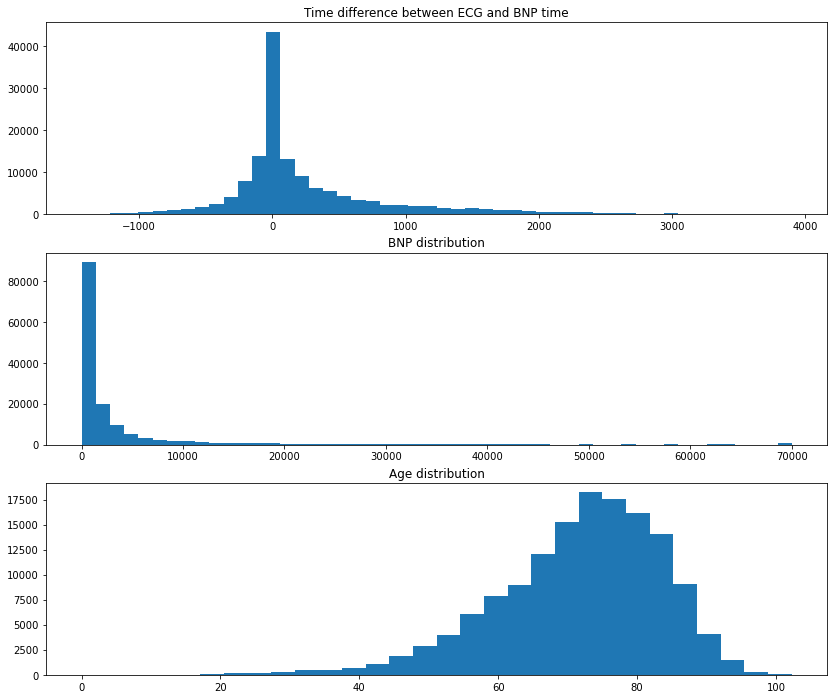

In [8]:
plt.figure(figsize =(14,12))
plt.subplot(311).set_title('Time difference between ECG and BNP time')
plt.hist(df['diff'],bins=50)
# try to filter data with time difference less then 3 month
df_tfilter = df.loc[abs(df['diff'])<= 90]
ratio = len(df_tfilter)/len(df) # 25% of ECG has a "near" BNP time
plt.subplot(312).set_title('BNP distribution')
plt.hist(df['BNP'],bins=50)
# try to filter data with BNP smaller then 125mg
df_bnpfilter = df.loc[abs(df['BNP'])<= 125]
ratio = len(df_bnpfilter)/len(df) # 16.5% of ECG has a "good" BNP value
plt.subplot(313).set_title('Age distribution')
plt.hist(df['Age'],bins=30)
plt.show()

#### Plot4: Scatter plot shows distribution of BNP, Age, Gender

In [9]:
fig = px.scatter(df,y='BNP',x='Age',color='Gender',width=500, height=400)
fig.show()

#### Plot5:ECG+BNP(12 leads seperately, only shows lead1 here)
#### compare ECG plot of "good" BNP patient(red) vs ECG of "bad" BNP patient(blue)
#### around 4000 records have a "good" BNP

In [10]:
lead_bnpfilter = df.loc[(abs(df['BNP'])<= 125)|((abs(df['BNP'])<= 450)&(df['Age']>=75))]

In [11]:
lead_bnpfilter_index = lead_bnpfilter.index

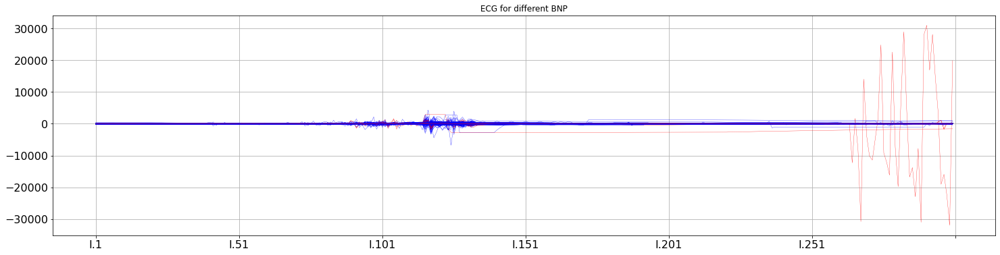

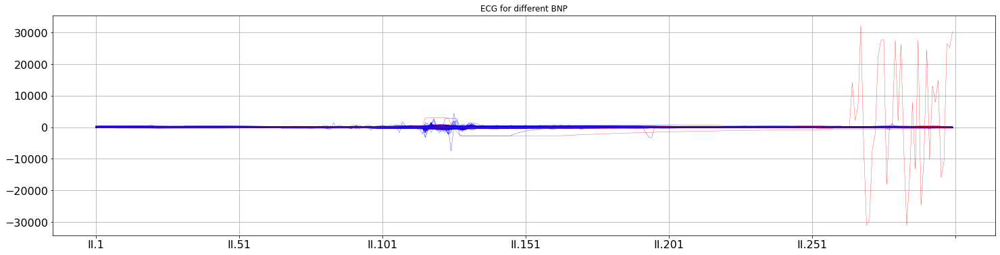

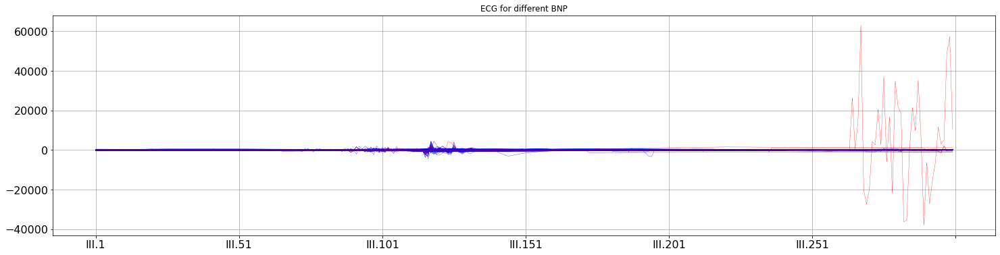

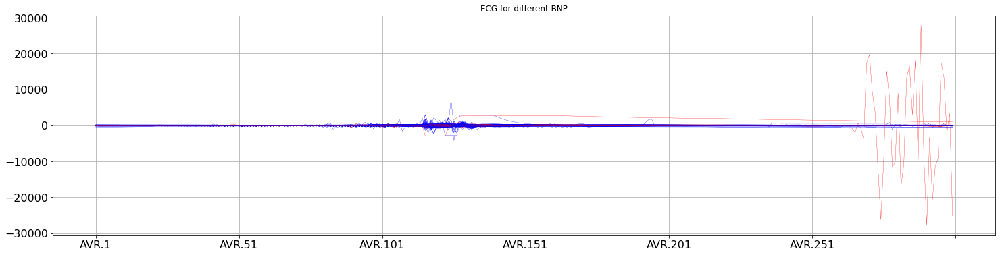

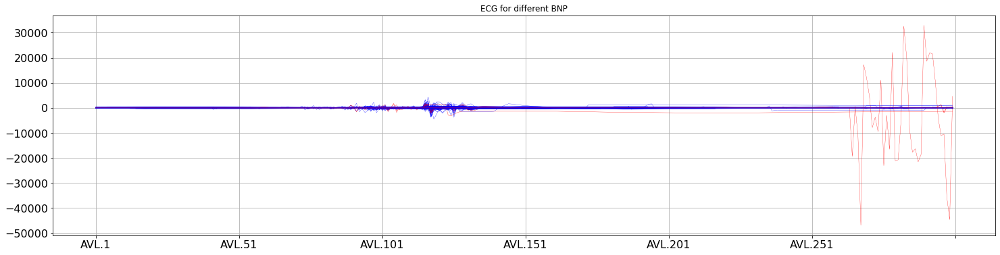

...

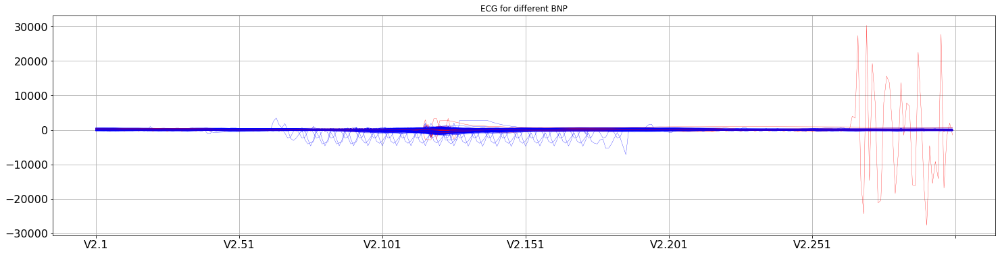

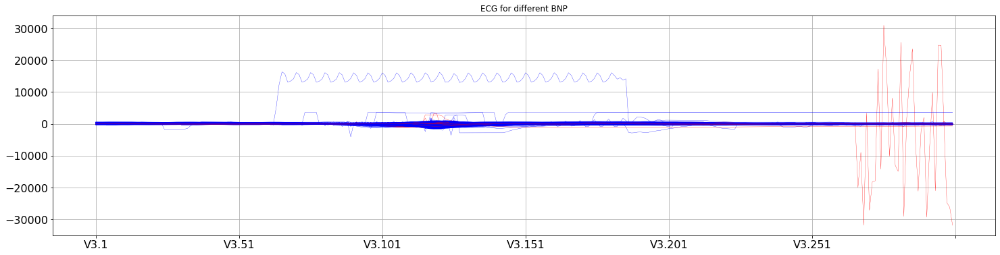

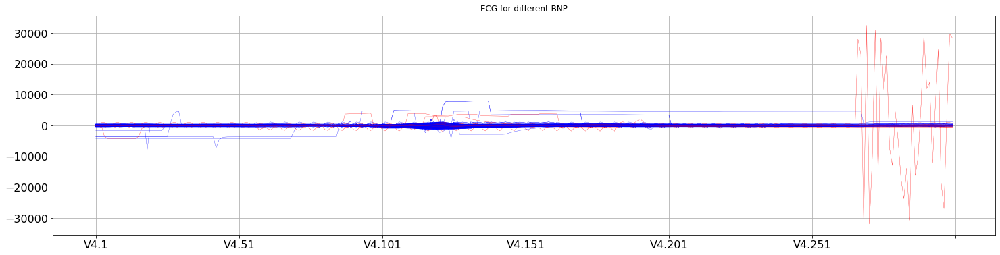

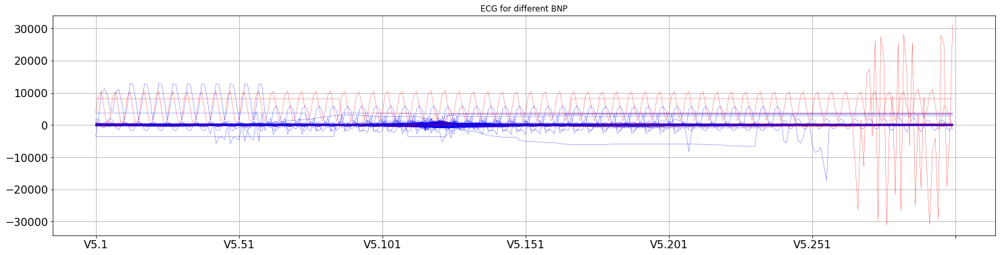

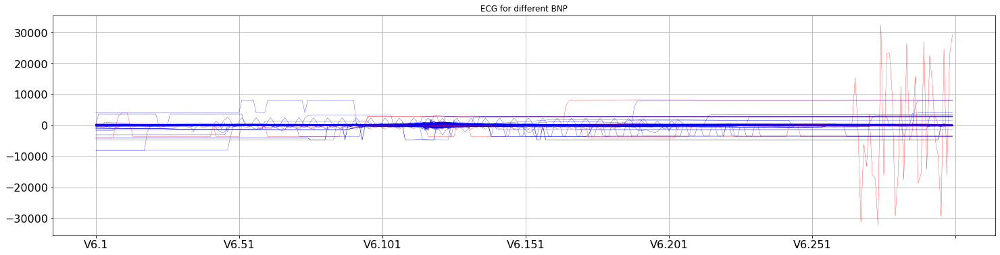

In [12]:
l = np.array([])
for i in range(len(lead_bnpfilter_index)):
    l = np.append(l,str(lead_bnpfilter_index[i]))
m = np.array([])
for j in range(len(df.index)):
    if str(j) in l:
        m = np.append(m,'red' ) 
    else:
         m = np.append(m,'blue' )
            
            
for lead_num in range(12):
    lead_i = df.iloc[0:df.shape[0],6+300*lead_num:306+300*lead_num]
    lead_i= lead_i.transpose()
    fig, ax = plt.subplots()
    lead_i.plot(figsize=(25,6), title='ECG for different BNP', 
                lw=3, fontsize=16, ax=ax, grid=True, color = m, legend=False )
    for line in ax.get_lines():
        if line.get_label() in l:
            line.set_linewidth(0.3)
        else: line.set_linewidth(0.3)
    plt.show()